In [150]:
%matplotlib inline
from __future__ import print_function, unicode_literals
import sys, os
import datetime as dt
import seaborn as sns
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.gridspec as gridspec

In [2]:
from pygaarst import raster
import pandas as pd
import geopandas as gp
from fiona.crs import from_string
import shapely.ops
from shapely.geometry import Point
from matplotlib.collections import PatchCollection
from descartes import PolygonPatch

Trying `CDLL(/Users/cwaigl/anaconda2/envs/snakes/lib/libgeos_c.dylib)`
DEBUG:shapely.geos:Trying `CDLL(/Users/cwaigl/anaconda2/envs/snakes/lib/libgeos_c.dylib)`
Library path: '/Users/cwaigl/anaconda2/envs/snakes/lib/libgeos_c.dylib'
DEBUG:shapely.geos:Library path: '/Users/cwaigl/anaconda2/envs/snakes/lib/libgeos_c.dylib'
DLL: <CDLL '/Users/cwaigl/anaconda2/envs/snakes/lib/libgeos_c.dylib', handle 7ff68bdae3d0 at 11be1e9d0>
DEBUG:shapely.geos:DLL: <CDLL '/Users/cwaigl/anaconda2/envs/snakes/lib/libgeos_c.dylib', handle 7ff68bdae3d0 at 11be1e9d0>
Trying `CDLL(/usr/lib/libc.dylib)`
DEBUG:shapely.geos:Trying `CDLL(/usr/lib/libc.dylib)`
Library path: '/usr/lib/libc.dylib'
DEBUG:shapely.geos:Library path: '/usr/lib/libc.dylib'
DLL: <CDLL '/usr/lib/libc.dylib', handle 7fff6bcd0b90 at 11be1e990>
DEBUG:shapely.geos:DLL: <CDLL '/usr/lib/libc.dylib', handle 7fff6bcd0b90 at 11be1e990>


In [25]:
from functools import partial
from shapely.geometry import box

In [3]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes, mark_inset

In [4]:
sys.path.append('../firedetection/')
import landsat8fire as lfire

In [151]:
sns.set(rc={'image.cmap': 'gist_heat'})
sns.set(rc={'image.cmap': 'bone'})

sns.set_context("poster", font_scale=1.4)

myfontsize = 20
font = {'family' : 'Calibri',
        'weight': 'bold',
        'size'   : myfontsize}
matplotlib.rc('font', **font)
matplotlib.axes.rcParams['axes.labelsize']=myfontsize-4
matplotlib.axes.rcParams['axes.titlesize']=myfontsize
matplotlib.rcParams['figure.figsize'] = (12, 6)
cmap1 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'bright red']))
cmap2 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'neon green']))
cmap3 =  matplotlib.colors.ListedColormap(sns.xkcd_palette(['white', 'orange']))

In [6]:
viirsdatadir = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/10_intermediate_products/"
newviirspolydf = gp.GeoDataFrame.from_file(os.path.join(viirsdatadir, '2015YKviirsspoly_20170503.shp'))

DEBUG:Fiona:Got coordinate system
DEBUG:Fiona:Index: 0


In [7]:
landsatpath = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/Landsat/L8 OLI_TIRS 20150706/'
lsscene = 'LC80730142015187LGN00'
landsat = raster.Landsatscene(os.path.join(landsatpath, lsscene))

In [8]:
productdir = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/rasterout/'

In [9]:
landsat.infix = '_clip'
rho7 = landsat.band7.reflectance
rho6 = landsat.band6.reflectance
rho5 = landsat.band5.reflectance
rho1 = landsat.band1.reflectance

In [10]:
xmax = landsat.band7.ncol
ymax = landsat.band7.nrow

In [19]:
landsat.meta['PRODUCT_METADATA']['DATE_ACQUIRED'], landsat.meta['PRODUCT_METADATA']['SCENE_CENTER_TIME']

(datetime.date(2015, 7, 6), datetime.time(21, 36, 48, 604527))

In [20]:
crs = from_string(landsat.band7.proj4)
samplerecords = newviirspolydf[
    (newviirspolydf['DATE'] == '2015-07-06') & 
    (newviirspolydf['GMT'] == '2136')]
samplerecords = samplerecords.drop_duplicates(subset=['LAT', 'LON', 'DATE', 'GMT'])
firepolygons_h = samplerecords[(samplerecords['Type'] != 'L')]['geometry'].to_crs(crs)
firepolygons_l = samplerecords[(samplerecords['Type'] == 'L')]['geometry'].to_crs(crs)

In [21]:
samplerecords['GMT'].value_counts()

2136    1110
Name: GMT, dtype: int64

In [22]:
firepolygons_h.count()

796

In [23]:
firepolygons_l.count()

314

## Generate Landsat fire pixels

In [11]:
reload(lfire)

<module 'landsat8fire' from '../firedetection/landsat8fire.pyc'>

In [12]:
water = lfire.get_l8watermask(landsat)

In [13]:
water_masked = np.ma.masked_where(
        ~water, np.ones((ymax, xmax)))


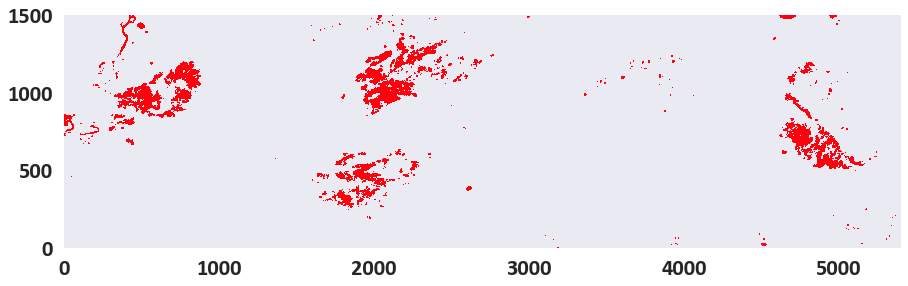

In [14]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')

ax1.pcolormesh(np.flipud(water_masked), cmap=cmap1, vmin=0, vmax=1)

In [ ]:
allfire, highfire, anomfire, lowfire = lfire.get_l8fire(landsat, debug=True)

Getting Landsat 8 reflectances
Getting unambiguous fires
There are 14937 unambiguous fires
Getting anomalous fires
There are 18 anomalous fires
Getting candidates for marginal fires
Verifying 6549 candidates for marginal fires
Generating mask of valid pixel to validate 6549 marginal candidates
Starting loop through candidate locations.
. 

## Save fire points to file

In [13]:
import h5py

In [16]:
h5f = h5py.File("../data/WesternAKLandsat20161122_firepix.h5", "w")

In [17]:
grp = h5f.create_group('datasets')
dset_all = grp.create_dataset("all_fires", data=allfire)
dset_high = grp.create_dataset("high_fires", data=highfire)
dset_anom = grp.create_dataset("anomalous_fires", data=anomfire)
dset_low = grp.create_dataset("low_fires", data=lowfire)
grp.attrs['date'] = '2016-07-17'
grp.attrs['source'] = 'LC80730142015187LGN00'
grp.attrs['author'] = 'Chris Waigl'
grp.attrs['project'] = '2015VIIRS'


In [18]:
h5f.close()

In [20]:
sum(sum(allfire))

17948

In [ ]:
outfns = ["2015_YK_L8_allfire.tif", "2015_YK_L8_highfire.tif", "2015_YK_L8_anomfire.tif"]
rasters = [allfire, highfire, anomfire]
for outfn, rst in zip(outfns, rasters):
    outpath = os.path.join(productdir, outfn)
    landsat.band7.clone(outpath, rst.data.astype('int8'))

## Load L8 fire pixels from file 

In [15]:
fns = ["2015_YK_L8_allfire.tif", "2015_YK_L8_highfire.tif", "2015_YK_L8_anomfire.tif"]
rasterdir = '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/10_intermediate_products/'

In [16]:
allfire =  raster.GeoTIFF(os.path.join(rasterdir, fns[0]))
highfire =  raster.GeoTIFF(os.path.join(rasterdir, fns[1]))
anomfire =  raster.GeoTIFF(os.path.join(rasterdir, fns[2]))

In [17]:
sum(sum(highfire.data))

14937

In [18]:
allfire_masked = np.ma.masked_where(
        allfire.data == 0, np.ones((ymax, xmax)))
highfire_masked = np.ma.masked_where(
        highfire.data == 0, np.ones((ymax, xmax)))
anomfire_masked = np.ma.masked_where(
        anomfire.data == 0, np.ones((ymax, xmax)))

## Band-wise Landsat plots

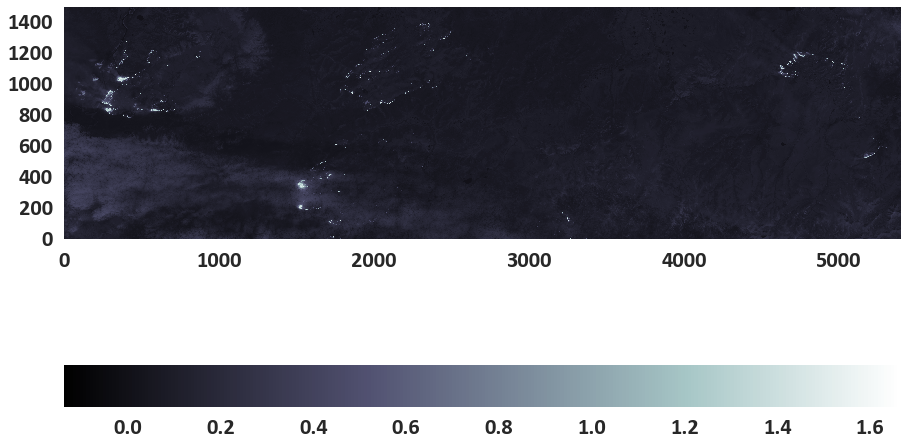

In [22]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho7))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

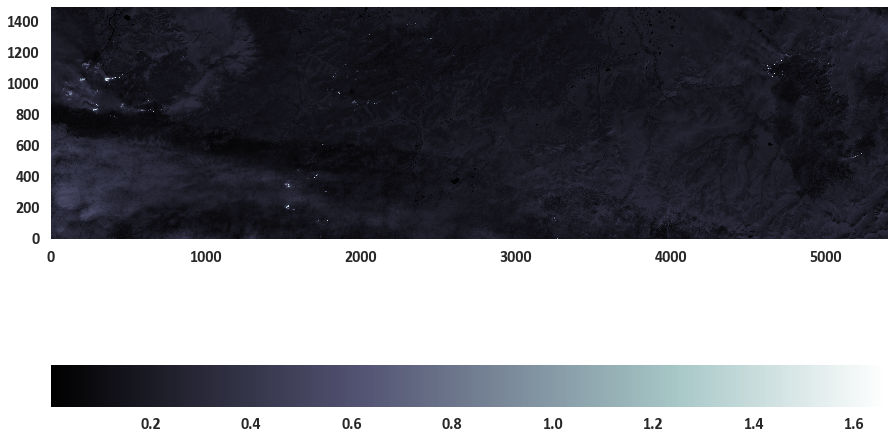

In [13]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho6))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

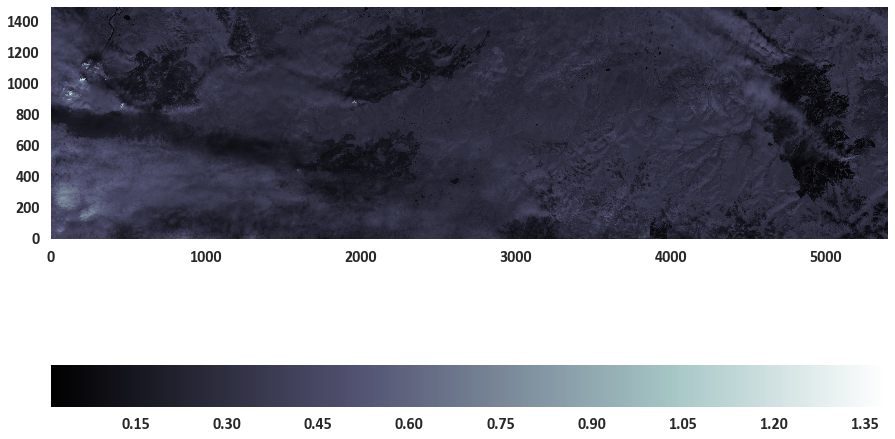

In [68]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho5))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

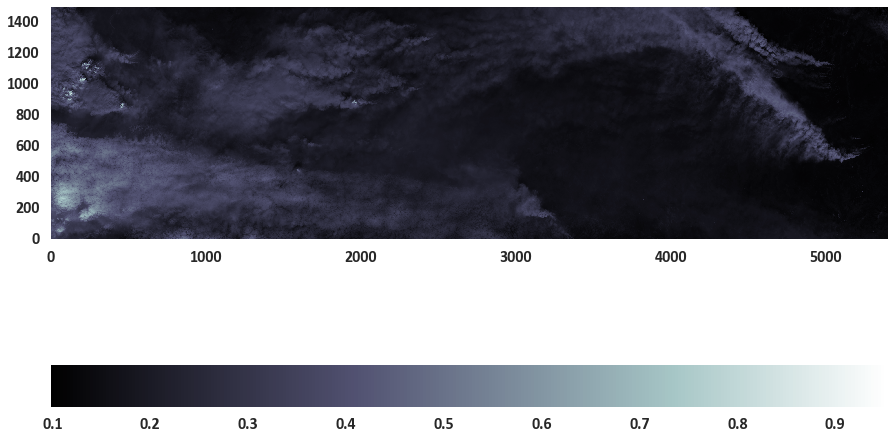

In [69]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(rho1))
cbar = fig1.colorbar(dataplot, orientation='horizontal')

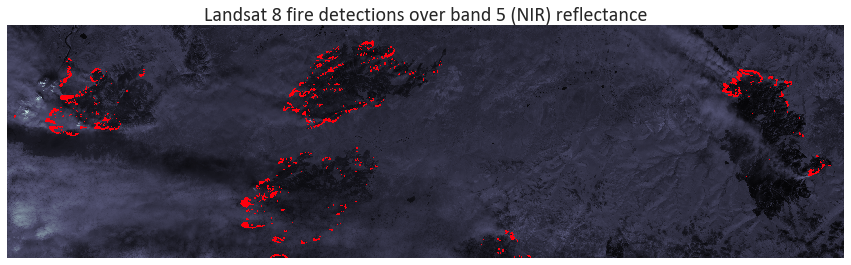

In [17]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_title("Landsat 8 fire detections over band 5 (NIR) reflectance")
dataplot = ax1.pcolormesh(np.flipud(rho5))
#maskplot3 = ax1.pcolormesh(np.flipud(firecond3_masked), cmap=cmap3, vmin=0, vmax=1)
#maskplot2 = ax1.pcolormesh(np.flipud(firecond2_masked), cmap=cmap2, vmin=0, vmax=1)
maskplot1 = ax1.pcolormesh(np.flipud(allfire_masked), cmap=cmap1, vmin=0, vmax=1)

In [27]:
outfn = '2016_YK_landsatB5_firemask.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=400, bb_inches='tight')

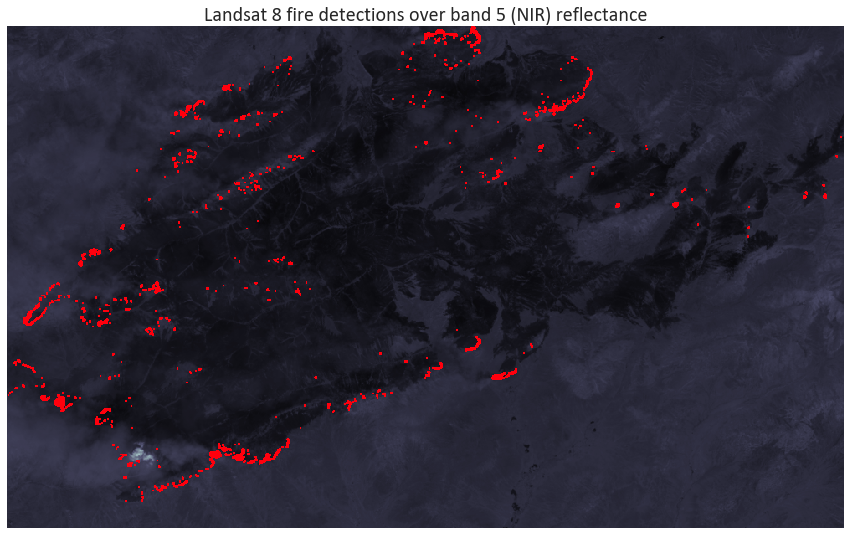

In [28]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((1800, 2800))
ax1.set_ylim((800, 1400))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_title("Landsat 8 fire detections over band 5 (NIR) reflectance")
dataplot = ax1.pcolormesh(np.flipud(rho5))
maskplot1 = ax1.pcolormesh(np.flipud(allfire_masked), cmap=cmap1, vmin=0, vmax=1)

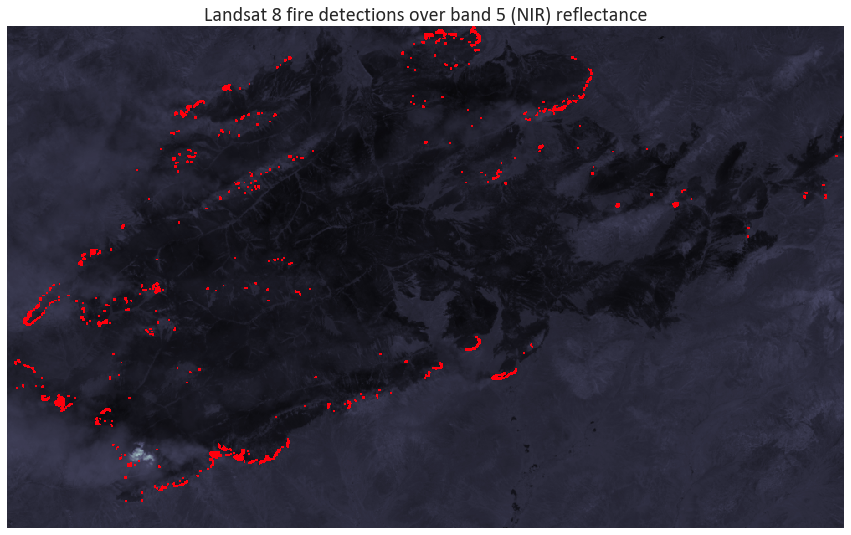

In [28]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((1800, 2800))
ax1.set_ylim((800, 1400))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.set_title("Landsat 8 fire detections over band 5 (NIR) reflectance")
dataplot = ax1.pcolormesh(np.flipud(rho5))
#maskplot3 = ax1.pcolormesh(np.flipud(firecond3_masked), cmap=cmap3, vmin=0, vmax=1)
#maskplot2 = ax1.pcolormesh(np.flipud(firecond2_masked), cmap=cmap2, vmin=0, vmax=1)
maskplot1 = ax1.pcolormesh(np.flipud(firecond1_masked), cmap=cmap1, vmin=0, vmax=1)

In [19]:
samplerecords['GMT'].value_counts()

2136    1110
Name: GMT, dtype: int64

In [20]:
firepolygons_h.count()

796

In [21]:
firepolygons_l.count()

314

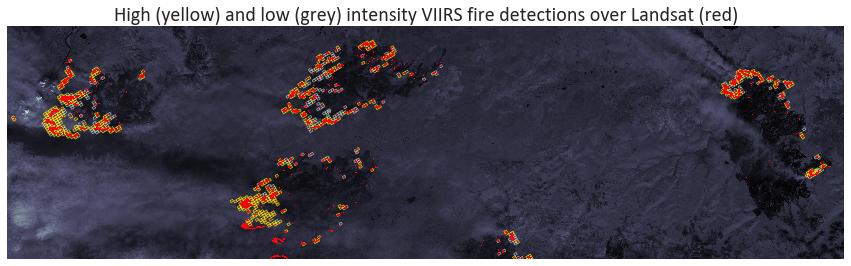

In [131]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.pcolormesh(X, Y, rho5)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=0.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=0.5) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)


In [ ]:
outfn = 'WesternAK_landsat_firemask_footprints.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=300, bb_inches='tight')

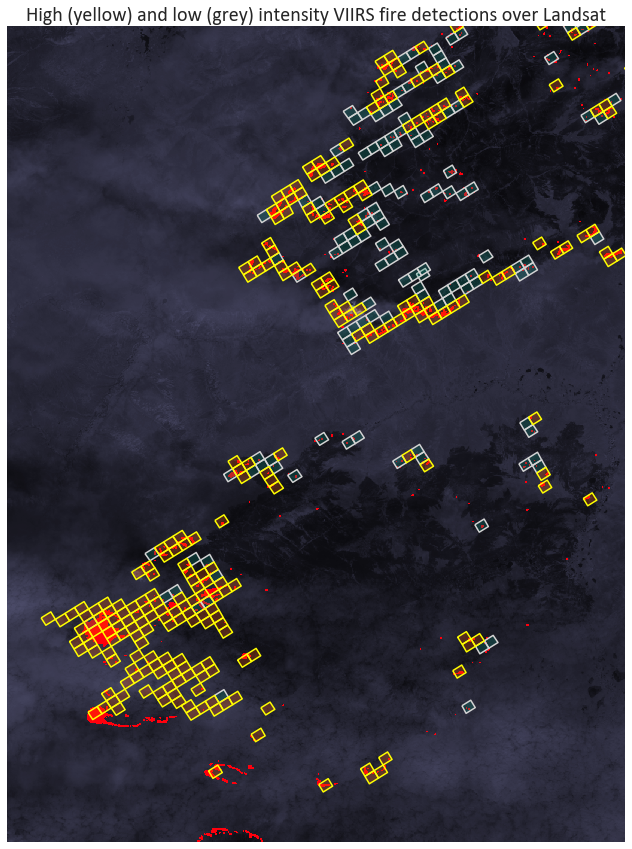

In [132]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((474000, 505000))
ax1.set_ylim((7330000, Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)
patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=1.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, color='pink', alpha=0.75) for poly in firepolygons_h]
patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=1.5) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))


## Now in RGB

In [24]:
rgb753scene = raster.GeoTIFF(os.path.join(landsatpath, lsscene, 'LC80730142015187LGN00_fc753_8bit_clip.tif'))
rgb753 = np.rollaxis(rgb753scene.data, 0, 3)

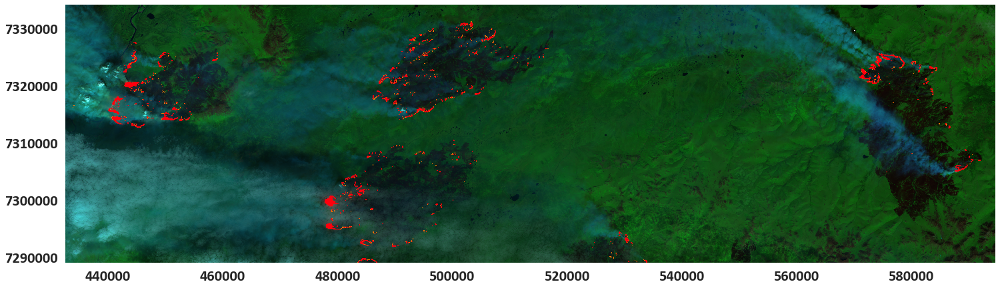

In [28]:
fig1 = plt.figure(1, figsize=(25, 20))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
#ax1.set_xlim((649000, X[0, -1]))
#ax1.set_ylim((Y[0][0], 6847000))
ax1.invert_yaxis()
#ax1.set_xticklabels([])
#ax1.set_yticklabels([])
#ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap3, vmin=0, vmax=1)
maskplot2 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)

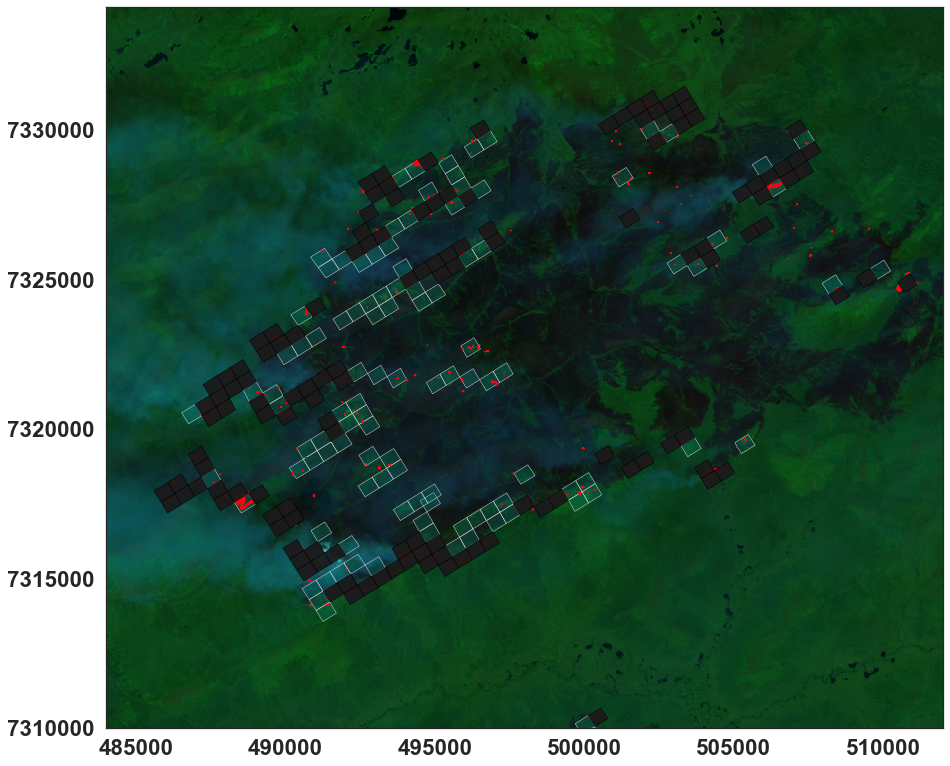

In [35]:
sns.set_style('white')
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((484000, 512000))
ax1.set_ylim((Y[0][0], 7310000))
#ax1.set_xticklabels([])
#ax1.set_yticklabels([])
ax1.invert_yaxis()
#ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat")
#dataplot = ax1.pcolormesh(X, Y, rho5)
#patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
#ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, color='pink', alpha=0.75) for poly in firepolygons_h]
#patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
#ax1.add_collection(PatchCollection(patches, match_original=True))
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
patches1 = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches1, match_original=True))
#patches2 = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=.5) for poly in firepolygons_h]
#ax1.add_collection(PatchCollection(patches2, match_original=True))
#maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)
maskplot1 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)
patches2 = [PolygonPatch(poly, facecolor=(.1, 0.1, 0.1, .95), edgecolor='black', lw=.5) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches2, match_original=True))


In [137]:
outfn = '2015_YK_VIFDAHL.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=400, bb_inches='tight')

In [135]:
samplerecords.to_crs(crs).head()

,AscNode,Bands,DATE,GMT,LAT,LON,Platform,SatZenithA,Sensor,SolZenithA,TB4,TB5,Type,geometry
0,Y,I-Bands,2015-07-06,2136,65.439606,-152.213028,NPP,32.051739,VIIRS,43.211994,367.0,299.111969,A,"POLYGON ((536154.408941029 7257717.580768922, ..."
1,Y,I-Bands,2015-07-06,2136,65.862053,-151.052811,NPP,27.754086,VIIRS,43.528515,367.0,310.424713,A,"POLYGON ((588544.0287148765 7305972.16367586, ..."
2,Y,I-Bands,2015-07-06,2136,65.860077,-151.061188,NPP,27.784838,VIIRS,43.527222,367.0,310.091248,A,"POLYGON ((588162.2074221228 7305736.180906503,..."
3,Y,I-Bands,2015-07-06,2136,65.692650,-152.295959,NPP,31.324392,VIIRS,43.464497,367.0,304.696381,A,"POLYGON ((531989.493136391 7285869.373446679, ..."
4,Y,I-Bands,2015-07-06,2136,65.061653,-154.906403,NPP,39.144943,VIIRS,43.122398,367.0,297.381531,A,"POLYGON ((410047.5024040422 7216783.964494495,..."


In [44]:
ullat = 66.2
ullon = -155.0
lrlat = 65.7
lrlon = -150.0

RSAC version

In [43]:
firehotspots = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/activefiremaps.fs.fed.us_data_fireptdata/"
viirsIdir = "viirs_iband_fire_2015_344_ak_shapefile"
viirsIshp = "viirs_iband_fire_2015_344_ak_AKAlbers.shp"
viirsIDF = gp.GeoDataFrame.from_file(os.path.join(firehotspots, viirsIdir, viirsIshp))

DEBUG:Fiona:Got coordinate system
INFO:Fiona:Failed to auto identify EPSG: 7
DEBUG:Fiona:Params: +proj=aea +lat_1=55 +lat_2=65 +lat_0=50 +lon_0=-154 +x_0=0 +y_0=0 +datum=NAD83 +units=m +no_defs 
DEBUG:Fiona:Index: 0


Wilfrid Schroeder NASA version

In [26]:
wsfirehotspots = "/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/VIIRS_I_WS_NASA/Alaska/fires.2015187.2130.txt"
inputframe = pd.read_csv(wsfirehotspots)
viirsIDF = gp.GeoDataFrame.from_file(wsfirehotspots)

FionaValueError: No dataset found at path '/Volumes/SCIENCE_mobile_Mac/Fire/DATA_BY_PROJECT/2015VIIRSMODIS/VIIRS_I_WS_NASA/Alaska/fires.2015187.2130.txt' using drivers: *

In [46]:
inputframe.columns = [colname.strip() for colname in inputframe.columns]

In [37]:
inputframe.Lon.min()

-145.77238

In [45]:
testviirsDF = viirsIDF[(viirsIDF.LAT < ullat) & (viirsIDF.LAT > lrlat)
        & (viirsIDF.LONG < lrlon) & (viirsIDF.LONG > ullon)]
testviirsDF = testviirsDF.loc[(testviirsDF['DATE'] == '2015-07-06') & (testviirsDF['GMT'] == 2137)]

In [46]:
testviirsDF.shape

(633, 15)

In [120]:
testviirsDF.head()

,AREA,BT4TEMP,BT5TEMP,CONF,DATE,FIRE_,FIRE_ID,GMT,JULIAN,LAT,LONG,PERIMETER,SAT_SRC,SRC,geometry
5608,0.0,346.8,297.8,Nominal,2015-07-06,5609,424015,2137,187,66.101,-152.928,0.0,S-NPP,rsac,POINT (48596.8230249666 1794055.051318426)
5635,0.0,345.5,303.4,Nominal,2015-07-06,5636,425816,2137,187,66.100,-152.951,0.0,S-NPP,rsac,POINT (47548.48987747393 1793894.773493965)
5667,0.0,334.8,297.8,Nominal,2015-07-06,5668,435642,2137,187,66.099,-152.937,0.0,S-NPP,rsac,POINT (48180.35180702181 1793790.21478764)
5686,0.0,345.9,312.0,Nominal,2015-07-06,5687,440039,2137,187,66.098,-152.923,0.0,S-NPP,rsac,POINT (48821.25322634698 1793690.385047179)
5694,0.0,352.2,310.2,Nominal,2015-07-06,5695,426232,2137,187,66.097,-152.961,0.0,S-NPP,rsac,POINT (47109.48500415593 1793614.152832974)


In [41]:
side = 375.0
def makebox(point, a=100.0, b=None):
    if not b: 
        b=a
    return box((point.x)-a/2, point.y-b/2, point.x+a/2, point.y+b/2)

makeboxes = partial(makebox, a=side)

In [48]:
boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs
boxseries.to_crs(crs);

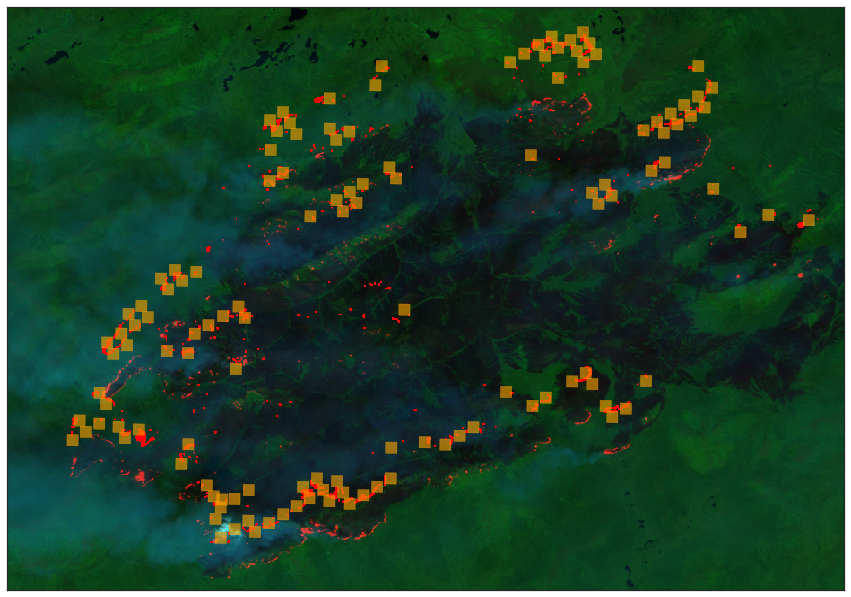

In [51]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((484000, 512000))
ax1.set_ylim((7332000, 7312500))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
#ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
#dataplot = ax1.pcolormesh(X, Y, rho5)
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], 7332000, Y[-1, 0]], interpolation='none')
maskplot1 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))


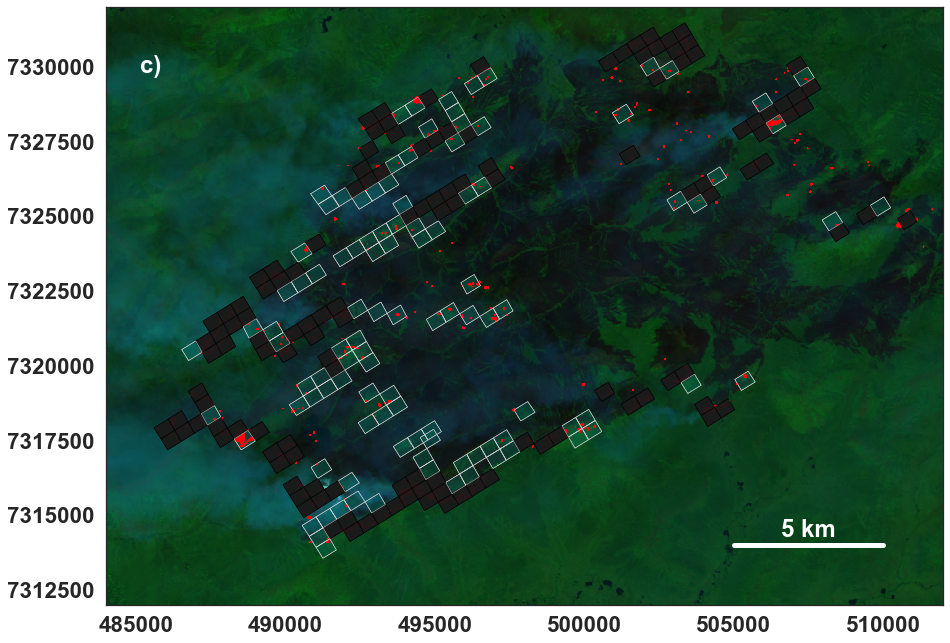

In [134]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((484000, 512000))
ax1.set_ylim((7332000, 7312000))
#ax1.set_xticklabels([])
#ax1.set_yticklabels([])
ax1.invert_yaxis()
#patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=3) for poly in firepolygons_l]
#ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, color='pink', alpha=0.75) for poly in firepolygons_h]
#patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=3) for poly in firepolygons_h]
#ax1.add_collection(PatchCollection(patches, match_original=True))
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
patches1 = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches1, match_original=True))
#patches2 = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=.5) for poly in firepolygons_h]
patches2 = [PolygonPatch(poly, facecolor=(.1, 0.1, 0.1, .95), edgecolor='black', lw=.5) for poly in firepolygons_h]

ax1.add_collection(PatchCollection(patches2, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, allfire_masked, cmap=cmap1, vmin=0, vmax=1)
#maskplot1 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)
ax1.add_collection(PatchCollection(patches2, match_original=True))
patches1 = [PolygonPatch(poly, facecolor=(1, 1, 1, 0.0), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches1, match_original=True))

ax1.plot([505000, 510000], [7314000, 7314000], color='w', lw=5)
ax1.text(507500, 7314500, 
         '5 km', 
          ha="center", va="center", 
          color='w', size=24)
ax1.text(485500, 7330000, 
         'c)', 
          ha="center", va="center", 
          color='w', size=24)

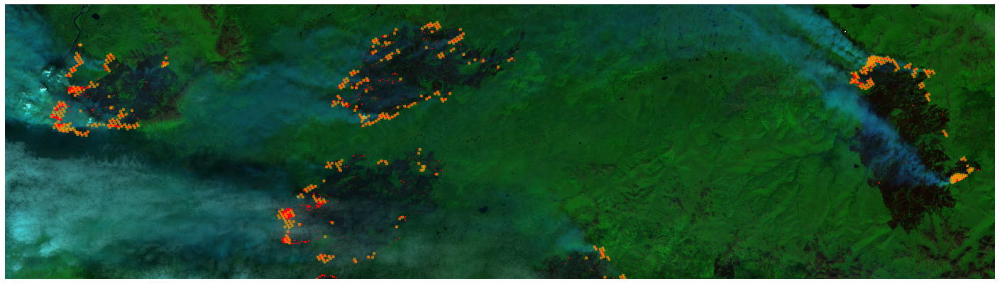

In [123]:
fig1 = plt.figure(1, figsize=(25, 20))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], 7312500))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
#ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
#dataplot = ax1.pcolormesh(X, Y, rho5)
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
maskplot1 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))


In [ ]:
outfn = 'WesternAK_landsat_firemask_footprints_global_zoom.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=300, bb_inches='tight')

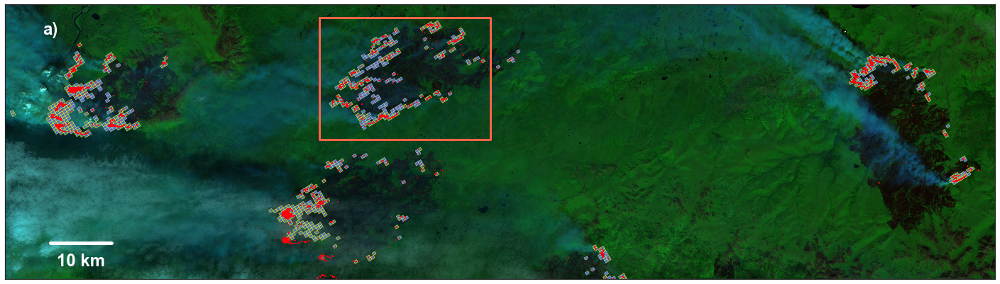

In [133]:
fig1 = plt.figure(1, figsize=(25, 20))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.invert_yaxis()
ax1.set_xticklabels([])
ax1.set_yticklabels([])
#ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
#patches = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
patches = [PolygonPatch(poly, edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
#patches = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=.5) for poly in firepolygons_h]
patches = [PolygonPatch(poly, edgecolor='yellow', lw=.5) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
ax1.plot([440000, 450000], [7295000, 7295000], color='w', lw=5)
ax1.text(445000, 7292000, 
         '10 km', 
          ha="center", va="center", 
          color='w', size=24)
ax1.text(440000, 7330000, 
         'a)', 
          ha="center", va="center", 
          color='w', size=24)
ax1.plot([484000, 512000, 512000, 484000, 484000], [ 7332000, 7332000, 7312000, 7312000, 7332000 ], c='tomato', lw=3)



maskplot1 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)

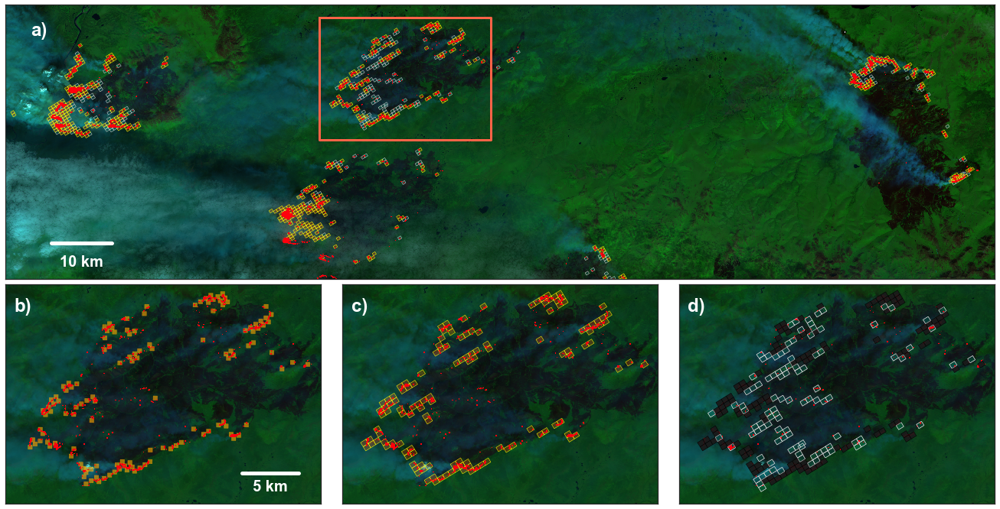

In [193]:
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
sns.set_style('white')

fig1 = plt.figure(figsize=(23.5, 12))
gs = gridspec.GridSpec(2, 3, height_ratios=[7.5, 6])
gs.update(wspace=0.02, hspace=0.02 )

patches1 = [PolygonPatch(poly, facecolor=(0, 0.55, 0.45, 0.25), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
patches2a = [PolygonPatch(poly, facecolor=(1, 0.35, 0, 0.25), edgecolor='yellow', lw=.5) for poly in firepolygons_h]
patches2b = [PolygonPatch(poly, facecolor=(.1, 0.1, 0.1, .95), edgecolor='black', lw=.5) for poly in firepolygons_h]
boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs
patches3 = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]


ax0 = plt.subplot(gs[0, :])
ax0.set_xlim((X[0][0], X[0, -1]))
ax0.set_ylim((Y[0][0], Y[-1, 0]))
dataplot = ax0.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
ax0.add_collection(PatchCollection(patches1, match_original=True))
ax0.add_collection(PatchCollection(patches2a, match_original=True))
ax0.plot([440000, 450000], [7295000, 7295000], color='w', lw=5)
ax0.text(445000, 7292000, 
         '10 km', 
          ha="center", va="center", 
          color='w', size=20)
ax0.text(438000, 7330000, 
         'a)', 
          ha="center", va="center", 
          color='w', size=24)
ax0.plot([484000, 512000, 512000, 484000, 484000], [ 7332000, 7332000, 7312000, 7312000, 7332000 ], c='tomato', lw=3)


ax1 = plt.subplot(gs[1, 0])
ax1.add_collection(PatchCollection(patches3, match_original=True))
ax1.plot([505000, 510000], [7315200, 7315200], color='w', lw=5)
ax1.text(507500, 7314000, 
         '5 km', 
          ha="center", va="center", 
          color='w', size=20)
ax1.text(485500, 7330000, 
         'b)', 
          ha="center", va="center", 
          color='w', size=24)

ax2 = plt.subplot(gs[1, 1])
ax2.add_collection(PatchCollection(patches2a, match_original=True))
ax2.text(485500, 7330000, 
         'c)', 
          ha="center", va="center", 
          color='w', size=24)

ax3 = plt.subplot(gs[1, 2])
ax3.add_collection(PatchCollection(patches1, match_original=True))
ax3.text(485500, 7330000, 
         'd)', 
          ha="center", va="center", 
          color='w', size=24)


for ax in [ax0, ax1, ax2, ax3]:
    ax.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    #ax.set_aspect('equal')
    if ax != ax0:
        ax.set_xlim((484000, 512000))
        ax.set_ylim((7332000, 7312500))
        ax.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
    ax.invert_yaxis()

ax3.add_collection(PatchCollection(patches2b, match_original=True))
patches1 = [PolygonPatch(poly, facecolor=(1, 1, 1, 0.0), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
ax3.add_collection(PatchCollection(patches1, match_original=True))


In [194]:
outfn = 'Fig09.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')
outfn = 'Fig09_LR.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=100, bb_inches='tight')

In [ ]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((474000, 505000))
ax1.set_ylim((7330000, Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)
maskplot1 = ax1.pcolormesh(X, Y, firecond1_masked, cmap=cmap1, vmin=0, vmax=1)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))


In [60]:
outfn = 'WesternAK_landsat_firemask_footprints_global_zoom.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=300, bb_inches='tight')

NameError: name 'makeboxes' is not defined

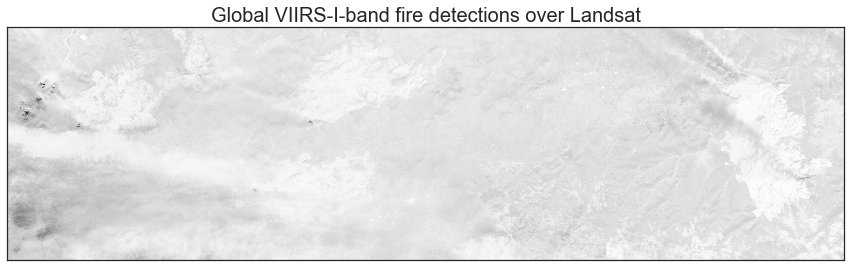

In [40]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.invert_yaxis()
ax1.set_title("Global VIIRS-I-band fire detections over Landsat")
dataplot = ax1.pcolormesh(X, Y, rho5)

boxseries = gp.GeoSeries(map(makeboxes, testviirsDF.geometry.values))
boxseries.crs = viirsIDF.geometry.crs

patches = [PolygonPatch(poly, color='orange', alpha=0.6) for poly in boxseries.to_crs(crs)]

if patches:
    ax1.add_collection(PatchCollection(patches, match_original=True))

## Statistics! 

In [102]:
firecond1idx = (ymax - np.where(allfire.data)[0], np.where(allfire.data)[1])
firecond1idx

(array([1400, 1399, 1399, ...,    2,    2,    1]),
 array([2357, 2355, 2356, ..., 1806, 1807, 1807]))

In [103]:
firepoints_h = [Point(lon, lat) 
    for lon, lat in zip(landsat.band7.Lon_pxcenter[firecond1idx], landsat.band7.Lat_pxcenter[firecond1idx])]


In [139]:
samplerecords.loc[samplerecords['Type'] == 'A', 'Type'] = 'H'

In [140]:
samplerecords.head()

,AscNode,Bands,DATE,GMT,LAT,LON,Platform,SatZenithA,Sensor,SolZenithA,TB4,TB5,Type,geometry
0,Y,I-Bands,2015-07-06,2136,65.439606,-152.213028,NPP,32.051739,VIIRS,43.211994,367.0,299.111969,H,"POLYGON ((-152.2204512415535 65.4400064381251,..."
1,Y,I-Bands,2015-07-06,2136,65.862053,-151.052811,NPP,27.754086,VIIRS,43.528515,367.0,310.424713,H,POLYGON ((-151.0592954974173 65.86267485026841...
2,Y,I-Bands,2015-07-06,2136,65.860077,-151.061188,NPP,27.784838,VIIRS,43.527222,367.0,310.091248,H,POLYGON ((-151.0678175364719 65.86066451101372...
3,Y,I-Bands,2015-07-06,2136,65.692650,-152.295959,NPP,31.324392,VIIRS,43.464497,367.0,304.696381,H,POLYGON ((-152.3035277283952 65.69300479589342...
4,Y,I-Bands,2015-07-06,2136,65.061653,-154.906403,NPP,39.144943,VIIRS,43.122398,367.0,297.381531,H,"POLYGON ((-154.912223626102 65.06252300142859,..."


In [141]:
samplerecords.describe()

,LAT,LON,SatZenithA,SolZenithA,TB4,TB5
count,1110.000000,1110.000000,1110.000000,1110.000000,1110.000000,1110.000000
mean,65.850840,-153.462688,33.309040,43.732084,335.061940,298.788373
std,0.317052,1.108035,2.961328,0.290427,21.569156,8.660760
min,64.707809,-155.579575,27.374468,42.767708,208.000000,278.480164
25%,65.834177,-154.293503,31.888583,43.686665,325.866302,294.314667
50%,65.964252,-153.387459,33.374496,43.836224,335.794235,297.760620
75%,66.002645,-153.031654,34.810905,43.916565,347.114990,301.491760
max,66.100822,-151.006699,40.817661,44.006180,367.000000,365.854675


In [142]:
samplerecords['pointcount'] = 0

In [143]:
for idx, record in samplerecords.iterrows():
    poly = record['geometry']
    for pt in firepoints_h:
        if pt.within(poly):
            samplerecords.loc[idx, 'pointcount'] += 1

In [144]:
samplerecords.groupby('Type').describe()

LAT         LON  SatZenithA  SolZenithA         TB4  \
Type                                                                     
H    count  796.000000  796.000000  796.000000  796.000000  796.000000   
     mean    65.838566 -153.511175   33.456827   43.725159  338.672205   
     std      0.317377    1.129533    2.987996    0.293229   24.198770   
     min     64.709953 -155.579575   27.374468   42.767708  208.000000   
     25%     65.822477 -154.351486   31.920085   43.672774  332.743546   
     50%     65.959332 -153.441582   33.486242   43.818533  341.086411   
     75%     65.998407 -153.050713   35.127984   43.923657  349.849640   
     max     66.100822 -151.006699   40.817661   44.006180  367.000000   
L    count  314.000000  314.000000  314.000000  314.000000  314.000000   
     mean    65.881957 -153.339773   32.934397   43.749639  325.909803   
     std      0.314587    1.043241    2.863243    0.282899    6.622095   
     min     64.707809 -155.439621   27.405952   42.771118  320.001495   
     25%     65.933113 -154.204926   31.825656   43.707176  321.464645   
     50%     65.978405 -153.188759   32.330841   43.846489  323.830475   
     75%     66.013655 -153.005230   34.515081   43.906330  327.236053   
     max     66.090477 -151.020844   40.771576   43.995590  351.414734   

                   TB5  pointcount  
Type                                
H    count  796.000000  796.000000  
     mean   298.231524   14.368090  
     std      9.306173   30.506854  
     min    278.480164    0.000000  
     25%    293.537209    0.000000  
     50%    297.186737    3.000000  
     75%    301.141624   18.000000  
     max    365.854675  273.000000  
L    count  314.000000  314.000000  
     mean   300.200001    7.878981  
     std      6.558008   21.061708  
     min    290.810791    0.000000  
     25%    296.338196    0.000000  
     50%    298.697784    1.000000  
     75%    302.039307    5.000000  
     max    323.882080  207.000000

In [146]:
len(samplerecords[samplerecords.pointcount == 0])/float(len(samplerecords))

0.45585585585585586

In [145]:
firepolygons_h_empty = samplerecords[( (samplerecords['Type'] != 'L')) & 
                               (samplerecords['pointcount'] == 0)]['geometry'].to_crs(crs)
firepolygons_l_empty = samplerecords[(samplerecords['Type'] == 'L') & 
                               (samplerecords['pointcount'] == 0)]['geometry'].to_crs(crs)

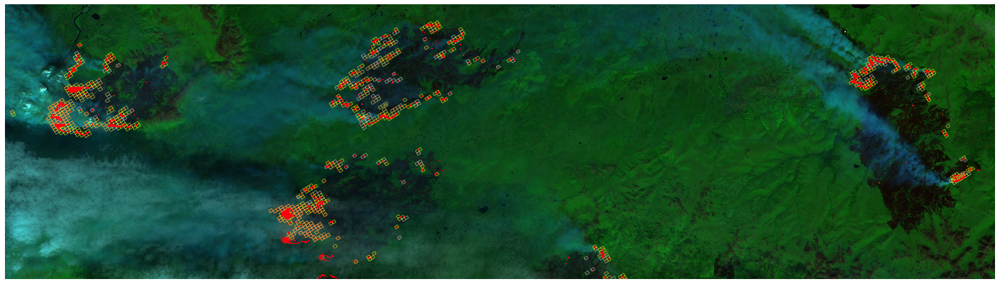

In [150]:
fig1 = plt.figure(1, figsize=(25, 20))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
X, Y =  landsat.band5._XY
Y = np.flipud(Y)
ax1.set_xlim((X[0][0], X[0, -1]))
ax1.set_ylim((Y[0][0], Y[-1, 0]))
ax1.invert_yaxis()
ax1.set_xticklabels([])
ax1.set_yticklabels([])
#ax1.set_title("High (yellow) and low (grey) intensity VIIRS fire detections over Landsat (red)")
dataplot = ax1.imshow(np.flipud(rgb753), extent=[X[0][0], X[0, -1], Y[0][0], Y[-1, 0]], interpolation='none')
patches = [PolygonPatch(poly, facecolor=(1, 1, 1, 0), edgecolor='lightgrey', lw=.5) for poly in firepolygons_l]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 1, 1, 0), edgecolor='yellow', lw=.5) for poly in firepolygons_h]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 1, 1, 0), edgecolor='olive', lw=.5) for poly in firepolygons_l_empty]
ax1.add_collection(PatchCollection(patches, match_original=True))
patches = [PolygonPatch(poly, facecolor=(1, 1, 1, 0), edgecolor='tomato', lw=.5) for poly in firepolygons_h_empty]
ax1.add_collection(PatchCollection(patches, match_original=True))
maskplot1 = ax1.pcolormesh(X, Y, highfire_masked, cmap=cmap1, vmin=0, vmax=1)

In [151]:
outfn = '2015_YK_landsat_firemask_footprints_empty_firepix.png'
fig1.savefig(os.path.join(productdir, outfn), dpi=300, bb_inches='tight')

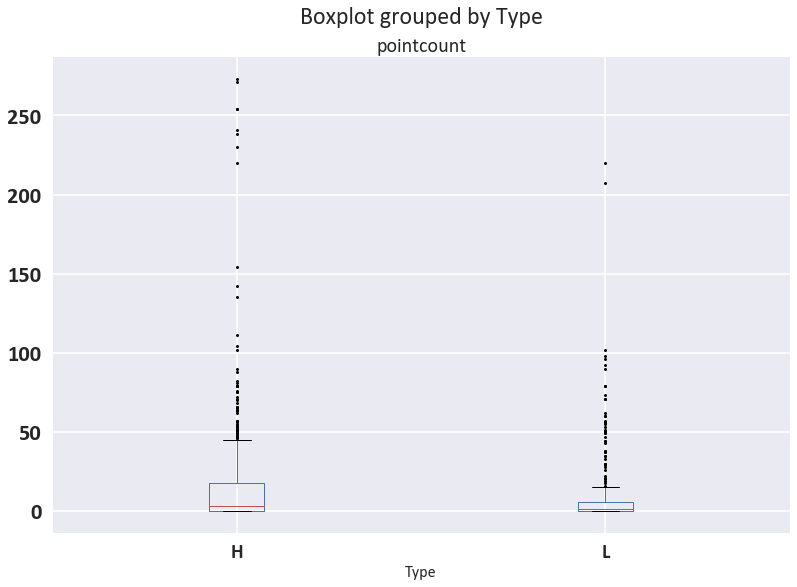

In [93]:
samplerecords[['pointcount', 'Type']].boxplot(column='pointcount', by='Type', sym='k.')
#ax = plt.gca()
#ax.set_ylim(-2, 57)


(-2, 32)

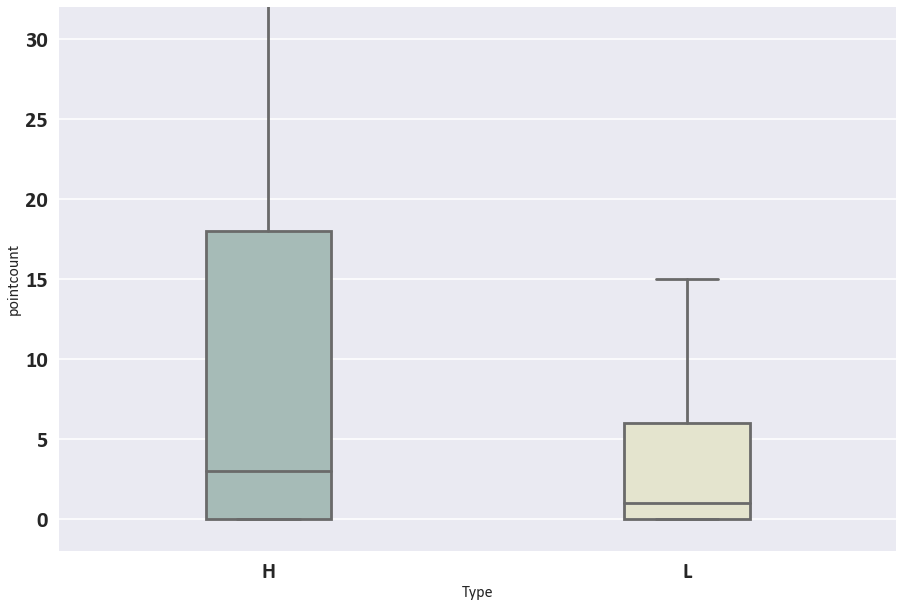

In [94]:
fig2 = plt.figure(1, figsize=(15, 10))
ax2 = fig2.add_subplot(111)
sns.boxplot(x='Type', y='pointcount', data=samplerecords, showfliers=False,
    palette="Set3", saturation=0.3, width=.3, ax=ax2)
#sns.swarmplot(
#    x='Type', y='pointcount', data=samplerecords, color=".25", size=10, ax=ax2)
ax2.set_ylim(-2, 32)

In [74]:
outfn = 'WesternAK_landsat_firematch_boxplot.png'
fig2.savefig(os.path.join(productdir, outfn), dpi=200, bb_inches='tight')

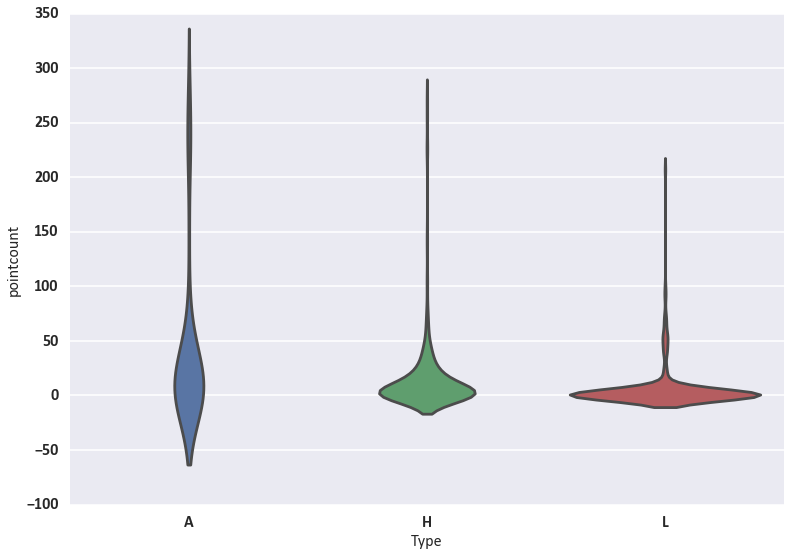

In [86]:
ax = sns.violinplot(x='Type', y='pointcount', data=samplerecords, inner=None)

### Look into NBR

In [87]:
NBR = landsat.NBR

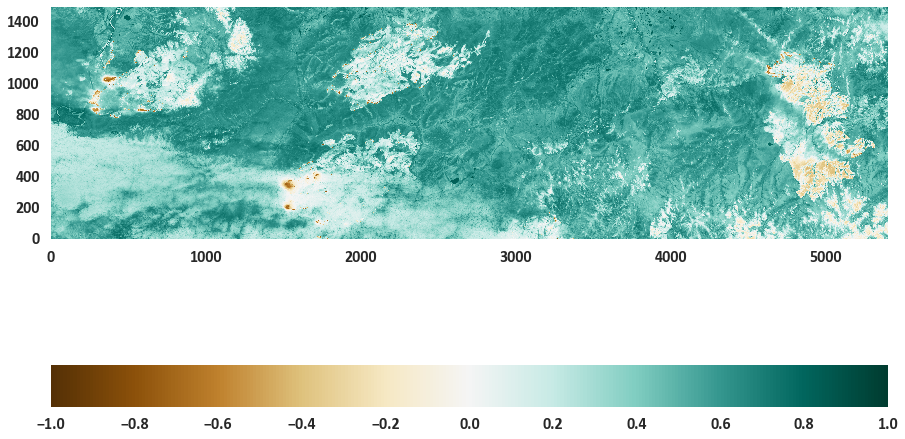

In [89]:
fig1 = plt.figure(1, figsize=(15, 15))
ax1 = fig1.add_subplot(111)
ax1.set_aspect('equal')
ax1.set_xlim((0, xmax))
ax1.set_ylim((0, ymax))
dataplot = ax1.pcolormesh(np.flipud(NBR), cmap='BrBG', vmin=-1., vmax=1.)
cbar = fig1.colorbar(dataplot, orientation='horizontal')